In [ ]:
# # Môi trường lập trình
# from google.colab import drive
# drive.mount("/content/gdrive")
# folder = '/content/gdrive/My Drive/Colab Notebooks/DATASET_DAP/Output'

In [ ]:
# # Đọc dữ liệu từ file CSV
# data = pd.read_csv(folder + '/weatherAUS_cleaned_3.1.csv')
# cluster_df = data.copy()
# cluster_df.info()

### 4.2.1. **File và Thư viện**

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from IPython import display
import warnings
warnings.filterwarnings('ignore')

In [ ]:
# https://drive.google.com/file/d/1P4ILFVOrmmYH6BibikRytI1cbWa_RKas/view?usp=sharing
!gdown --id 1P4ILFVOrmmYH6BibikRytI1cbWa_RKas

/usr/local/lib/python3.10/dist-packages/gdown/cli.py:121: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1P4ILFVOrmmYH6BibikRytI1cbWa_RKas
To: /content/weatherAUS_cleaned_3.1.csv
100% 22.5M/22.5M [00:00<00:00, 67.9MB/s]


In [ ]:
# Đọc dữ liệu trên colab
cluster_df = pd.read_csv('/content/weatherAUS_cleaned_3.1.csv')
cluster_df.tail()

,Date,Location,MinTemp,MaxTemp,Rainfall,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,RainTomorrow,is_RainToday,is_RainTomorrow,State/Territory,Postal,Region Type,Region,Month,Year,Season
131936,2017-06-20,Uluru,3.5,21.8,0.0,7.624853,E,31.0,ESE,E,...,No,0.0,0.0,Northern Territory,NT,Internal territory,North,6,2017,Dry
131937,2017-06-21,Uluru,2.8,23.4,0.0,7.624853,E,31.0,SE,ENE,...,No,0.0,0.0,Northern Territory,NT,Internal territory,North,6,2017,Dry
131938,2017-06-22,Uluru,3.6,25.3,0.0,7.624853,NNW,22.0,SE,N,...,No,0.0,0.0,Northern Territory,NT,Internal territory,North,6,2017,Dry
131939,2017-06-23,Uluru,5.4,26.9,0.0,7.624853,N,37.0,SE,WNW,...,No,0.0,0.0,Northern Territory,NT,Internal territory,North,6,2017,Dry
131940,2017-06-24,Uluru,7.8,27.0,0.0,7.624853,SE,28.0,SSE,N,...,No,0.0,0.0,Northern Territory,NT,Internal territory,North,6,2017,Dry


In [ ]:
# group by theo 'Location', 'Month', 'Year' và lấy yếu vị làm đại diện
cluster_reduced_mode_df = cluster_df.groupby(['Location', 'Month',
                        'Year']).agg(lambda x: x.mode().iat[0]).reset_index()
# sắp xếp và đặt cột theo thứ tự 'Location' -> 'Year' -> 'Month'
cluster_reduced_mode_df = cluster_reduced_mode_df.groupby(['Location', 'Year',
                        'Month']).first().reset_index()

# trung bình
cluster_reduced_mean_df = cluster_df.groupby(['Location', 'Month',
                        'Year']).mean().reset_index()
cluster_reduced_mean_df = cluster_reduced_mean_df.groupby(['Location', 'Year',
                        'Month']).first().reset_index()

# trung vị
cluster_reduced_median_df = cluster_df.groupby(['Location', 'Month',
                        'Year']).median().reset_index()
cluster_reduced_median_df = cluster_reduced_median_df.groupby(['Location', 'Year',
                        'Month']).first().reset_index()

In [ ]:
print(f'Số lượng quan sát của bộ dữ liệu ban đầu: {cluster_df.shape[0]}',
      f'\nSố lượng quan sát sau khi thực hiện lấy đại diện: {cluster_reduced_mode_df.shape[0]}')

Số lượng quan sát của bộ dữ liệu ban đầu: 131941 
Số lượng quan sát sau khi thực hiện lấy đại diện: 4762


Tạo hàm vẽ biểu đồ phân tán để xác định cụm theo các biến cho trước

In [ ]:
season_palette = {
    'Spring': sns.xkcd_rgb['grapefruit'],
    'Summer': '#ffa300',
    'Autumn': '#00bfa0',
    'Winter': '#27aeef',
    'Wet': '#0bb4ff',
    'Dry': '#ef9b20',
    1.0: '#0bb4ff',
    0.0: '#ef9b20',
    'Yes': '#0bb4ff',
    'No': '#ef9b20'
}

In [ ]:
def cluster_analysis(df, x, y, cluster, title):
    sns.set(style='whitegrid')
    plt.figure(figsize=(12, 6))
    sns.scatterplot(x=x, y=y, data=df, hue=cluster, palette=season_palette, alpha=0.5)
    plt.title(f'{title}')
    plt.xlabel(x)
    plt.ylabel(y)
    plt.show()

### 4.2.2. Phân tích cụm

#### Quan sát sự phân bố nhiệt độ theo mùa

In [ ]:
# tính thống kê mô tả các biến nhiệt độ theo mùa
col = ['MinTemp', 'MaxTemp', 'Temp9am', 'Temp3pm']
summary_stats1 = cluster_df.groupby('Season')[col].agg(['count', 'mean', 'std', 'var'])

# đổi tên cột
summary_stats1.columns = pd.MultiIndex.from_product([col, ['Count', 'Mean', 'Std', 'Variance']])
display.display(summary_stats1)

MinTemp                                 MaxTemp                       \
         Count       Mean       Std   Variance   Count       Mean       Std   
Season                                                                        
Autumn   33052  12.289465  5.460725  29.819522   33052  23.098804  5.456384   
Dry       4456  14.038323  7.899673  62.404829    4456  28.614824  6.139405   
Spring   29865  11.153886  5.282634  27.906219   29865  22.954660  5.834236   
Summer   29695  16.337836  4.748875  22.551812   29695  28.305922  5.665488   
Wet       3794  21.636744  4.780856  22.856583    3794  33.967580  3.908558   
Winter   31079   7.119783  4.752224  22.583634   31079  17.049039  4.249394   

                  Temp9am                                 Temp3pm             \
         Variance   Count       Mean       Std   Variance   Count       Mean   
Season                                                                         
Autumn  29.772131   33052  16.681444  5.181156  26.844380   33052  21.740607   
Dry     37.692288    4456  20.416750  6.814438  46.436560    4456  26.915377   
Spring  34.038306   29865  16.907248  5.201595  27.056586   29865  21.274741   
Summer  32.097756   29695  21.277390  4.741600  22.482775   29695  26.432687   
Wet     15.276824    3794  27.323774  3.921730  15.379970    3794  32.328172   
Winter  18.057347   31079  11.218064  4.612622  21.276279   31079  15.926306   

                             
             Std   Variance  
Season                       
Autumn  5.401354  29.174624  
Dry     5.999173  35.990082  
Spring  5.760744  33.186177  
Summer  5.631379  31.712427  
Wet     4.180012  17.472500  
Winter  4.223048  17.834134

Vẽ crosstab theo tần suất xuất hiện trong khoảng tứ phân vị

In [ ]:
# tính tứ phân vị cho MinTemp
Q1 = cluster_df['MinTemp'].quantile(0.25)
Q2 = cluster_df['MinTemp'].quantile(0.5)
Q3 = cluster_df['MinTemp'].quantile(0.75)

# tạo nhãn cho các khoảng
labels = ['Q1', 'Q2', 'Q3', 'Q4']

# tạo các cột đếm số lần xuất hiện cho biến MinTemp
cluster_df['MinTemp_Counts'] = pd.cut(cluster_df['MinTemp'], bins=[-float('inf'), Q1, Q2, Q3, float('inf')], labels=labels)

# tạo pivot table
mintemp_pivot = pd.pivot_table(cluster_df, values='MinTemp', index='Season', columns='MinTemp_Counts', aggfunc='count', fill_value=0)

# thêm cột tổng cộng
mintemp_pivot = mintemp_pivot.assign(Sum=mintemp_pivot.sum(axis=1))

# hiện crosstab
print('Crosstab biến MinTemp đối với cụm Mùa:')
display.display(mintemp_pivot)

Crosstab biến MinTemp đối với cụm Mùa:


MinTemp_Counts,Q1,Q2,Q3,Q4,Sum
Season,,,,,
Autumn,6514,9150,9909,7479,33052
Dry,1148,664,652,1992,4456
Spring,7700,9176,8307,4682,29865
Summer,1098,4364,9713,14520,29695
Wet,32,152,445,3165,3794
Winter,16798,9721,3646,914,31079


In [ ]:
# tính tứ phân vị cho MinTemp
Q1 = cluster_df['MaxTemp'].quantile(0.25)
Q2 = cluster_df['MaxTemp'].quantile(0.5)
Q3 = cluster_df['MaxTemp'].quantile(0.75)

# tạo nhãn cho các khoảng
labels = ['Q1', 'Q2', 'Q3', 'Q4']

# tạo các cột đếm số lần xuất hiện cho biến MinTemp
cluster_df['MaxTemp_Counts'] = pd.cut(cluster_df['MaxTemp'], bins=[-float('inf'), Q1, Q2, Q3, float('inf')], labels=labels)

# tạo pivot table
maxtemp_pivot = pd.pivot_table(cluster_df, values='MaxTemp', index='Season', columns='MaxTemp_Counts', aggfunc='count', fill_value=0)

# thêm cột tổng cộng
maxtemp_pivot = maxtemp_pivot.assign(Sum=maxtemp_pivot.sum(axis=1))

# hiện crosstab
print('Crosstab biến MaxTemp đối với cụm Mùa:')
display.display(maxtemp_pivot)

Crosstab biến MaxTemp đối với cụm Mùa:


MaxTemp_Counts,Q1,Q2,Q3,Q4,Sum
Season,,,,,
Autumn,6256,9963,10848,5985,33052
Dry,325,646,722,2763,4456
Spring,6515,9285,8118,5947,29865
Summer,681,4457,10172,14385,29695
Wet,2,54,209,3529,3794
Winter,19609,8536,2683,251,31079


In [ ]:
# tính tứ phân vị cho Temp9am
Q1 = cluster_df['Temp9am'].quantile(0.25)
Q2 = cluster_df['Temp9am'].quantile(0.5)
Q3 = cluster_df['Temp9am'].quantile(0.75)

# tạo nhãn cho các khoảng
labels = ['Q1', 'Q2', 'Q3', 'Q4']

# tạo các cột đếm số lần xuất hiện cho biến Temp9am
cluster_df['Temp9am_Counts'] = pd.cut(cluster_df['Temp9am'], bins=[-float('inf'), Q1, Q2, Q3, float('inf')], labels=labels)

# tạo pivot table
temp9am_pivot = pd.pivot_table(cluster_df, values='Temp9am', index='Season', columns='Temp9am_Counts', aggfunc='count', fill_value=0)

# thêm cột tổng cộng
temp9am_pivot = temp9am_pivot.assign(Sum=temp9am_pivot.sum(axis=1))

# hiện crosstab
print('Crosstab biến Temp9am đối với cụm Mùa:')
display.display(temp9am_pivot)

Crosstab biến Temp9am đối với cụm Mùa:


Temp9am_Counts,Q1,Q2,Q3,Q4,Sum
Season,,,,,
Autumn,6615,10214,10162,6061,33052
Dry,761,676,726,2293,4456
Spring,5974,9311,8782,5798,29865
Summer,601,4731,10076,14287,29695
Wet,2,65,305,3422,3794
Winter,19677,7913,2503,986,31079


In [ ]:
# tính tứ phân vị cho Temp3pm
Q1 = cluster_df['Temp3pm'].quantile(0.25)
Q2 = cluster_df['Temp3pm'].quantile(0.5)
Q3 = cluster_df['Temp3pm'].quantile(0.75)

# tạo nhãn cho các khoảng
labels = ['Q1', 'Q2', 'Q3', 'Q4']

# tạo các cột đếm số lần xuất hiện cho biến Temp3pm
cluster_df['Temp3pm_Counts'] = pd.cut(cluster_df['Temp3pm'], bins=[-float('inf'), Q1, Q2, Q3, float('inf')], labels=labels)

# tạo pivot table
temp3pm_pivot = pd.pivot_table(cluster_df, values='Temp3pm', index='Season', columns='Temp3pm_Counts', aggfunc='count', fill_value=0)

# thêm cột tổng cộng
temp3pm_pivot = temp3pm_pivot.assign(Sum=temp3pm_pivot.sum(axis=1))

# hiện crosstab
print('Crosstab biến Temp3pm đối với cụm Mùa:')
display.display(temp3pm_pivot)

Crosstab biến Temp3pm đối với cụm Mùa:


Temp3pm_Counts,Q1,Q2,Q3,Q4,Sum
Season,,,,,
Autumn,6123,9658,10813,6458,33052
Dry,277,631,913,2635,4456
Spring,6871,9214,7940,5840,29865
Summer,894,4514,10244,14043,29695
Wet,1,52,274,3467,3794
Winter,19039,8803,2899,338,31079


Đếm số lần xuất hiện của các cụm `Mùa` theo khoảng tứ phân vị của biến `Nhiệt độ`

| | MinTemp | | | | MaxTemp | | | | Temp9am | | | | Temp3pm | | | | Tổng cộng mỗi biến |
| - | - | - | - | - | - | - | - | - | - | - | - | - | - | - | - | - | - |
| | **Q1** | **Q2** | **Q3** | **Q4** | **Q1** | **Q2** | **Q3** | **Q4** | **Q1** | **Q2** | **Q3** | **Q4** | **Q1** | **Q2** | **Q3** | **Q4** | |
| **Mùa xuân** | 7700 | 9176 | 8307 | 4682 | 6515 | 9285 | 8118 | 5947 | 5974 | 9311 | 8782 | 5798 | 894 | 4514 | 10244 | 14043 | **29865** |
| **Mùa hè** | 1098 | 4364 | 9713 | 14520 | 681 | 4457 | 10172 | 14385 | 601 | 4731 | 10076 | 14287 | 894 | 4514 | 10244 | 14043 | **29695** |
| **Mùa thu**  | 6514 | 9150 | 9909 | 7479 | 6256 | 9963 | 10848 | 5985 | 6615 | 10214 | 10162 | 6061 | 6123 | 9658 | 10813 | 6458 | **33052** |
| **Mùa đông** | 16798 | 9721 | 3646 | 914 | 19609 | 8536 | 2683 | 251 | 19677 | 7913 | 2503 | 986 | 19039 | 8803 | 2899 | 338 | **31079** |
| **Mùa khô** | 1148 | 664 | 652 | 1992 | 325 | 646 | 722 | 2763 | 761 | 676 | 726 | 2293 | 277 | 631 | 913 | 2635 | **4456** |
| **Mùa mưa**  | 32 | 152 | 445 | 3165 | 2 | 54 | 209 | 3529 | 2 | 65 | 305 | 3422 | 1 | 52 | 274 | 3467 | **3794** |

In [ ]:
# tổng thể
print('Thống kê mô tả cả bộ dữ liệu:')
display.display(cluster_df[col].describe()[:3])

# lấy mẫu bằng mode
print('Đại diện bằng yếu vị mode:')
display.display(cluster_reduced_mode_df[col].describe()[:3])

# lấy mẫu bằng mean
print('Đại diện bằng trung bình mean:')
display.display(cluster_reduced_mean_df[col].describe()[:3])

# lấy mẫu bằng median
print('Đại diện bằng trung vị median:')
display.display(cluster_reduced_median_df[col].describe()[:3])

Thống kê mô tả cả bộ dữ liệu:


,MinTemp,MaxTemp,Temp9am,Temp3pm
count,131941.000000,131941.000000,131941.000000,131941.000000
mean,12.053680,23.311894,16.912194,21.800812
std,6.307246,6.889032,6.356213,6.705709


Đại diện bằng yếu vị mode:


,MinTemp,MaxTemp,Temp9am,Temp3pm
count,4762.000000,4762.000000,4762.000000,4762.000000
mean,10.680345,21.596677,15.611579,20.138749
std,6.317879,6.479777,6.152831,6.354474


Đại diện bằng trung bình mean:


,MinTemp,MaxTemp,Temp9am,Temp3pm
count,4762.000000,4762.000000,4762.000000,4762.000000
mean,12.084115,23.295891,16.912885,21.748772
std,5.628708,6.109174,5.798032,5.857370


Đại diện bằng trung vị median:


,MinTemp,MaxTemp,Temp9am,Temp3pm
count,4762.000000,4762.000000,4762.000000,4762.000000
mean,12.088394,23.061295,16.764680,21.561362
std,5.720226,6.183433,5.825398,5.944399


Sử dụng mean cho các giá trị định lượng bởi vì độ lệch chuẩn chênh lệch ít và giá trị trung bình chuẩn hơn so với 2 đại lượng còn lại. Còn các biến phân loại sử dụng phân tích (Season) sẽ lấy mode.

Phân chia mùa theo 2 loại:
- Loại 4 mùa: Xuân, Hạ, Thu, Đông
- Loại 2 mùa: Mưa, Khô

In [ ]:
season_type = cluster_df['Season'].unique()
season_type

array(['Summer', 'Autumn', 'Winter', 'Spring', 'Wet', 'Dry'], dtype=object)

In [ ]:
# lấy giá trị mean đại diện cho num
num_col = ['MinTemp', 'MaxTemp', 'Temp9am', 'Temp3pm']
cluster_reduced_numeric_df = cluster_df.groupby(['Location', 'Month',
                            'Year'])[num_col].mean().reset_index()
cluster_reduced_numeric_df = cluster_reduced_numeric_df.groupby(['Location', 'Year',
                            'Month'])[num_col].first().reset_index()

# lấy giá trị mode đại diện cho cate
cate_col = ['Season', 'RainToday', 'RainTomorrow']
cluster_reduced_categorical_df = cluster_df.groupby(['Location', 'Month',
                                'Year'])[cate_col].agg(lambda x: x.mode().iat[0]).reset_index()
cluster_reduced_categorical_df = cluster_reduced_categorical_df.groupby(['Location',
                                'Year', 'Month'])[cate_col].first().reset_index()

# kết hợp cả hai làm df để phân tích chính
cluster_reduced_df = pd.merge(cluster_reduced_numeric_df,
                              cluster_reduced_categorical_df, on=['Location', 'Year', 'Month'])

In [ ]:
# sử dụng tất cả quan sát
fourss_df1 = cluster_df[cluster_df['Season'].isin(['Summer', 'Autumn',
                                                   'Winter', 'Spring'])] # loại 4 mùa
twoss_df1 = cluster_df[cluster_df['Season'].isin(['Wet', 'Dry'])] # loại 2 mùa
# sử dụng quan sát của mẫu đại diện vừa tạo
fourss_df2 = cluster_reduced_df[cluster_reduced_df['Season'].isin(['Summer', 'Autumn',
                                                                   'Winter', 'Spring'])]
twoss_df2 = cluster_reduced_df[cluster_reduced_df['Season'].isin(['Wet', 'Dry'])]

In [ ]:
season_fourss_counts = fourss_df1['Season'].value_counts()
print(f'Số lượng 4 mùa:\n{season_fourss_counts}')
season_fourss_reduced_counts = fourss_df2['Season'].value_counts()
print(f'\nSố lượng 4 mùa đã giảm:\n{season_fourss_reduced_counts}')
season_twoss_counts = twoss_df1['Season'].value_counts()
print(f'\nSố lượng 2 mùa:\n{season_twoss_counts}')
season_twoss_reduced_counts = twoss_df2['Season'].value_counts()
print(f'\nSố lượng 2 mùa đã giảm:\n{season_twoss_reduced_counts}')

Số lượng 4 mùa:
Autumn    33052
Winter    31079
Spring    29865
Summer    29695
Name: Season, dtype: int64

Số lượng 4 mùa đã giảm:
Autumn    1161
Winter    1123
Summer    1087
Spring    1085
Name: Season, dtype: int64

Số lượng 2 mùa:
Dry    4456
Wet    3794
Name: Season, dtype: int64

Số lượng 2 mùa đã giảm:
Dry    156
Wet    150
Name: Season, dtype: int64


Đầu tiên, ta thực hiện quan sát phân bố của nhiệt độ tối thiểu và nhiệt độ tối đa theo mùa

In [ ]:
data = {'MinTemp': fourss_df1['MinTemp'],
        'MaxTemp': fourss_df1['MaxTemp']}
stats_temp_fourss1 = pd.DataFrame(data).describe()
display.display(stats_temp_fourss1)

,MinTemp,MaxTemp
count,123691.000000,123691.000000
mean,11.688239,22.794011
std,6.032729,6.635820
min,-6.900000,2.100000
25%,7.400000,17.800000
50%,11.600000,22.300000
75%,16.100000,27.400000
max,30.700000,44.500000


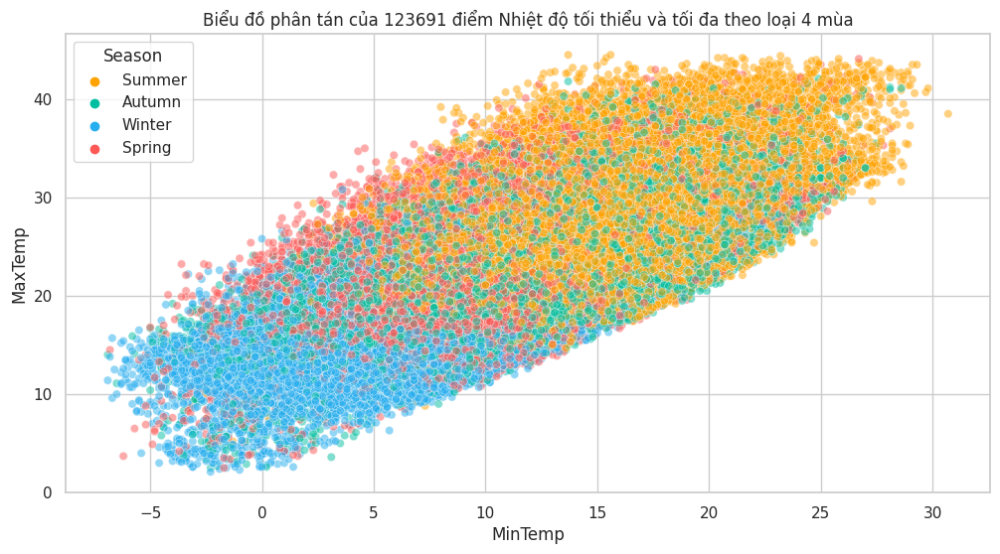

In [ ]:
title = f'Biểu đồ phân tán của {len(fourss_df1)} điểm Nhiệt độ tối thiểu và tối đa theo loại 4 mùa'
cluster_analysis(fourss_df1, 'MinTemp', 'MaxTemp', 'Season', title)

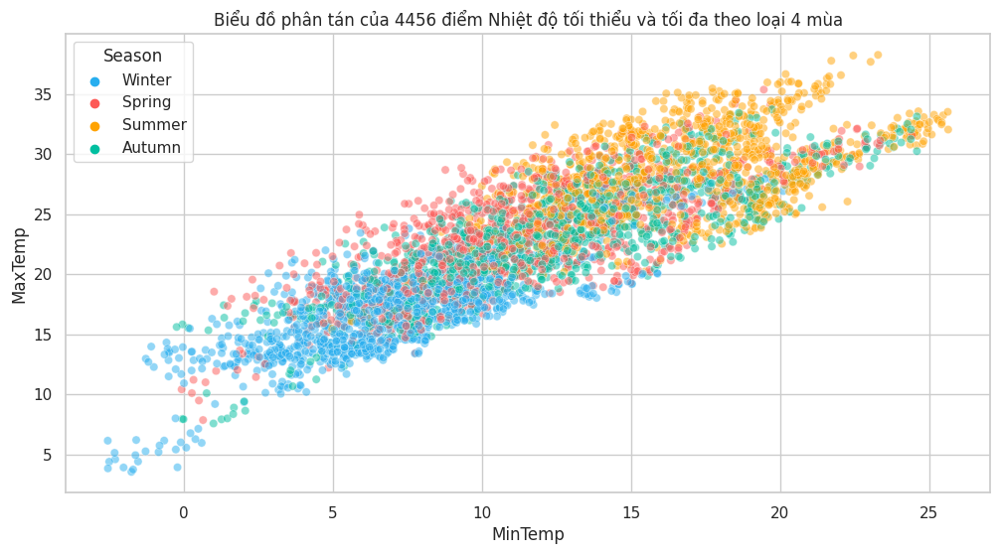

In [ ]:
title = f'Biểu đồ phân tán của {len(fourss_df2)} điểm Nhiệt độ tối thiểu và tối đa theo loại 4 mùa'
cluster_analysis(fourss_df2, 'MinTemp', 'MaxTemp', 'Season', title)

In [ ]:
data = {'MinTemp': twoss_df1['Temp9am'],
        'MaxTemp': twoss_df1['Temp3pm']}
stats_temp_twoss1 = pd.DataFrame(data).describe()
display.display(stats_temp_twoss1)

,MinTemp,MaxTemp
count,8250.000000,8250.000000
mean,23.593144,29.404607
std,6.633407,5.894862
min,4.200000,7.000000
25%,19.700000,26.100000
50%,25.600000,30.900000
75%,28.800000,33.100000
max,35.900000,41.800000


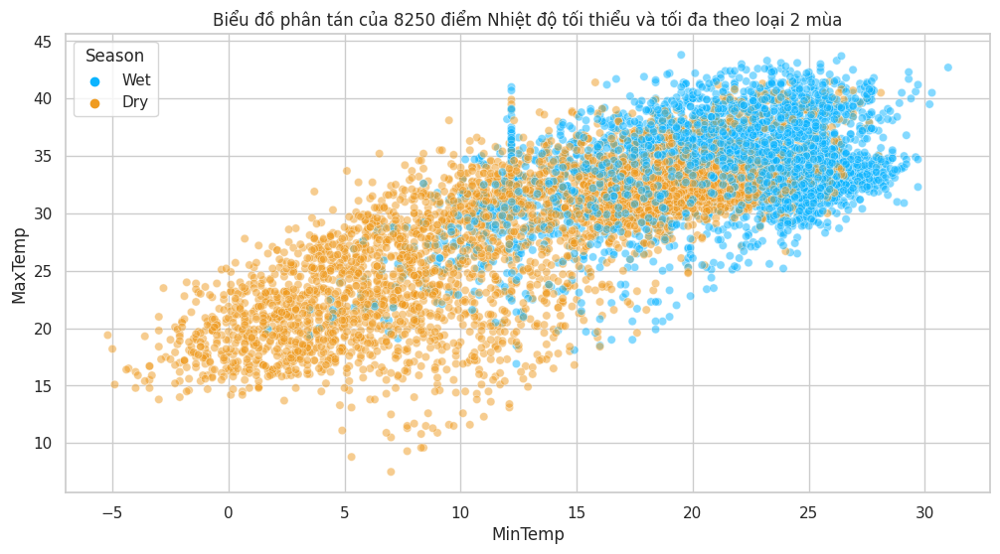

In [ ]:
title = f'Biểu đồ phân tán của {len(twoss_df1)} điểm Nhiệt độ tối thiểu và tối đa theo loại 2 mùa'
cluster_analysis(twoss_df1, 'MinTemp', 'MaxTemp', 'Season', title)

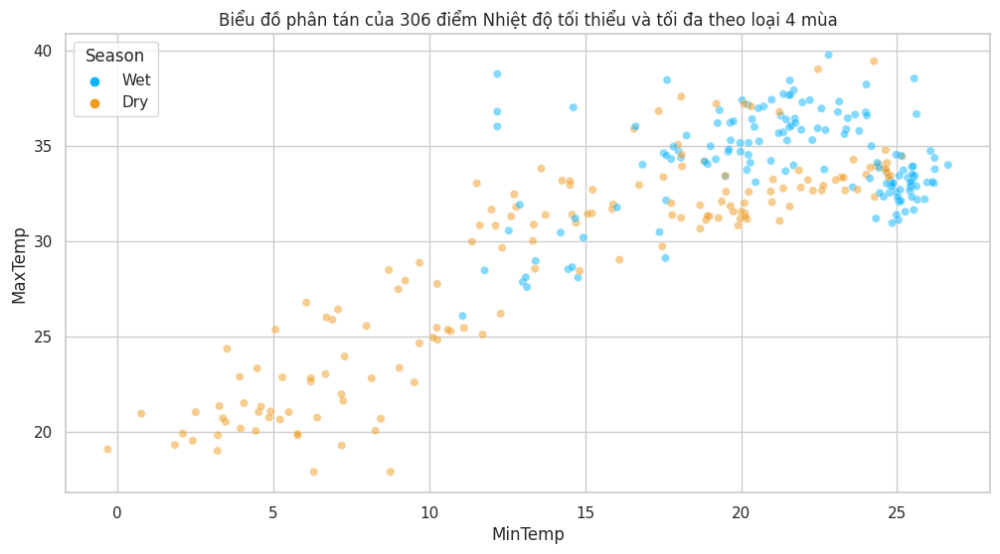

In [ ]:
title = f'Biểu đồ phân tán của {len(twoss_df2)} điểm Nhiệt độ tối thiểu và tối đa theo loại 4 mùa'
cluster_analysis(twoss_df2, 'MinTemp', 'MaxTemp', 'Season', title)

Tiếp theo thực hiện quan sát phân bố của nhiệt độ trong ngày khoảng 9 giờ sáng và 3 giờ chiều theo mùa

In [ ]:
data = {'Temp9am': fourss_df1['Temp9am'],
        'Temp3pm': fourss_df1['Temp3pm']}
stats_temp_fourss2 = pd.DataFrame(data).describe()
display.display(stats_temp_fourss2)

,Temp9am,Temp3pm
count,123691.000000,123691.000000
mean,16.466585,21.293651
std,6.081608,6.444741
min,-2.200000,1.600000
25%,12.100000,16.600000
50%,16.300000,20.900000
75%,20.800000,25.600000
max,36.100000,41.900000


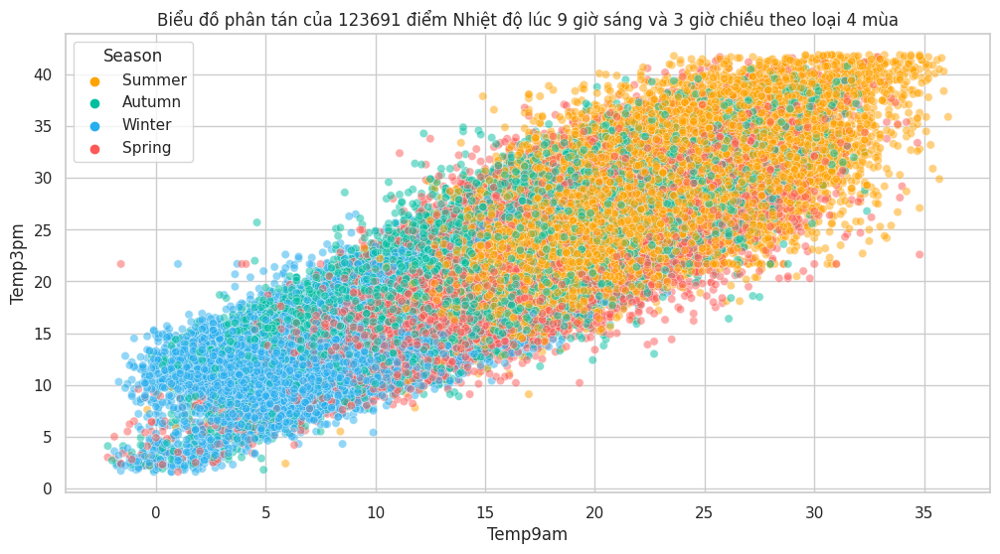

In [ ]:
title = f'Biểu đồ phân tán của {len(fourss_df1)} điểm Nhiệt độ lúc 9 giờ sáng và 3 giờ chiều theo loại 4 mùa'
cluster_analysis(fourss_df1, 'Temp9am', 'Temp3pm', 'Season', title)

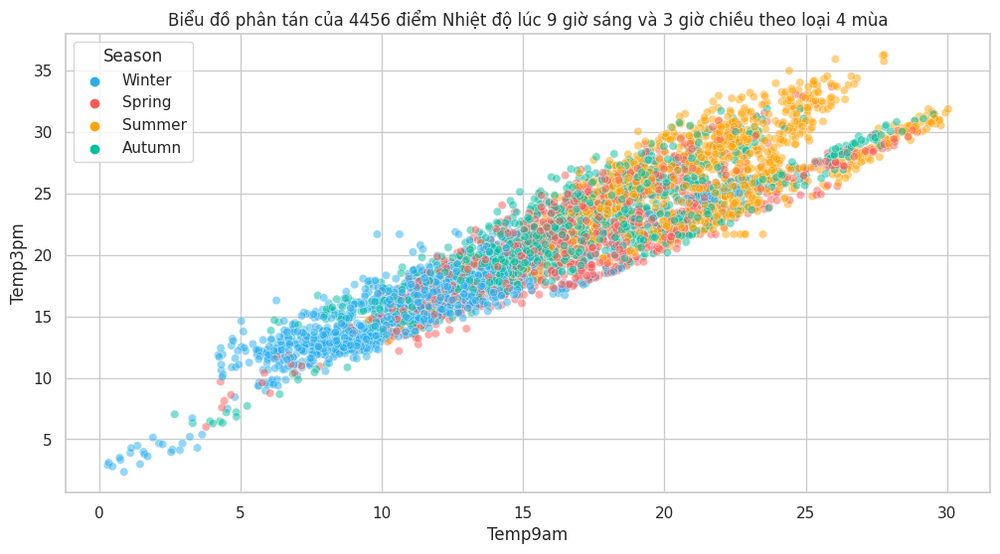

In [ ]:
title = f'Biểu đồ phân tán của {len(fourss_df2)} điểm Nhiệt độ lúc 9 giờ sáng và 3 giờ chiều theo loại 4 mùa'
cluster_analysis(fourss_df2, 'Temp9am', 'Temp3pm', 'Season', title)

In [ ]:
data = {'Temp9am': twoss_df1['Temp9am'],
        'Temp3pm': twoss_df1['Temp3pm']}
stats_temp_twoss2 = pd.DataFrame(data).describe()
display.display(stats_temp_twoss2)

,Temp9am,Temp3pm
count,8250.000000,8250.000000
mean,23.593144,29.404607
std,6.633407,5.894862
min,4.200000,7.000000
25%,19.700000,26.100000
50%,25.600000,30.900000
75%,28.800000,33.100000
max,35.900000,41.800000


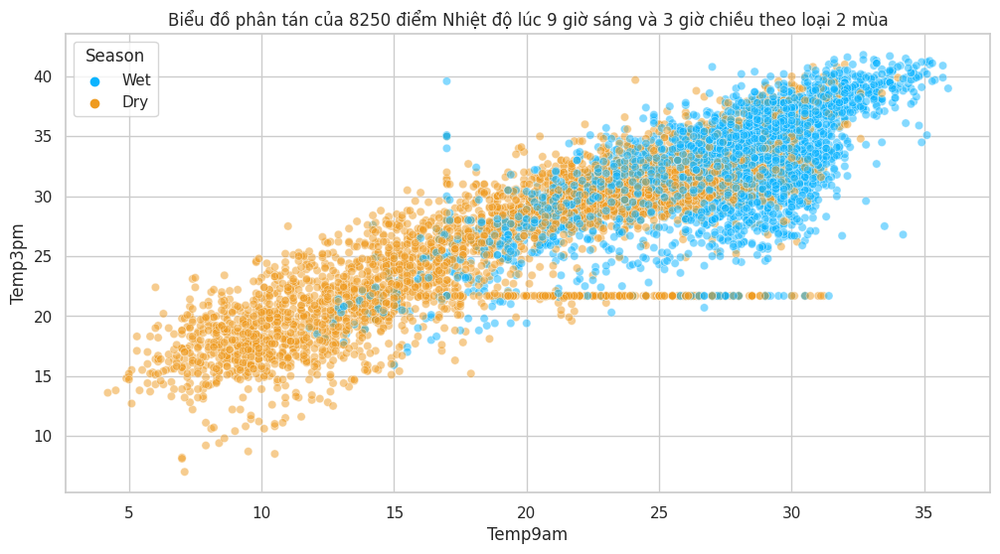

In [ ]:
title = f'Biểu đồ phân tán của {len(twoss_df1)} điểm Nhiệt độ lúc 9 giờ sáng và 3 giờ chiều theo loại 2 mùa'
cluster_analysis(twoss_df1, 'Temp9am', 'Temp3pm', 'Season', title)

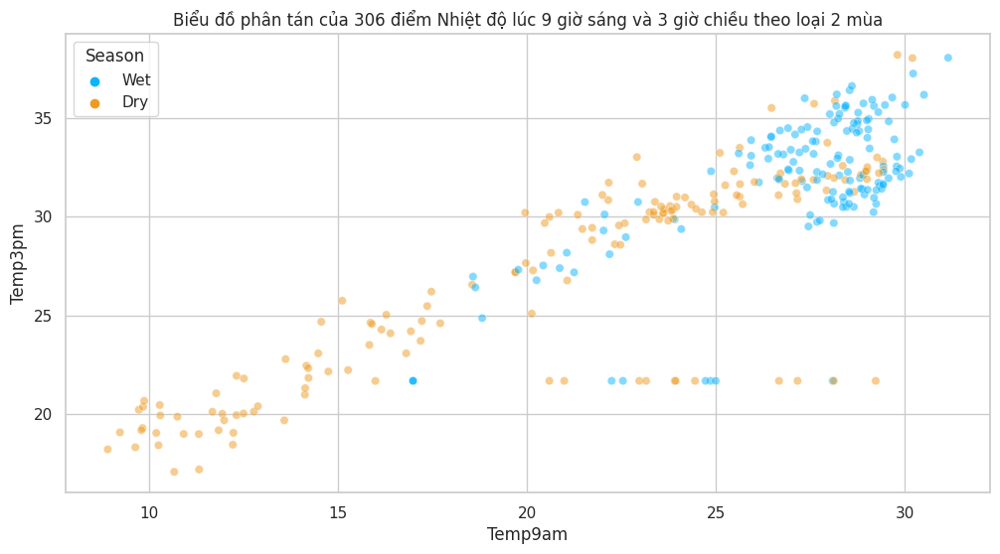

In [ ]:
title = f'Biểu đồ phân tán của {len(twoss_df2)} điểm Nhiệt độ lúc 9 giờ sáng và 3 giờ chiều theo loại 2 mùa'
cluster_analysis(twoss_df2, 'Temp9am', 'Temp3pm', 'Season', title)

Nhận xét:
* Nhìn chung, ta có thể nhìn thấy quy luật: Nếu giá trị nhiệt độ tối thiểu tăng thì giá trị nhiệt độ tối đa cũng có xu hướng tăng (tỷ lệ thuận). Điều tương tự đối với giá trị nhiệt độ vào buổi sáng và buổi tối.
- Trong biểu đồ phân tán, có những "đường" giá trị vuông góc với 2 trục: điều này có thể là do phương pháp điền null theo Mean() của biến trong quá trình tiền xử lý dữ liệu.
- Những đường giá trị vuông góc của 2 biểu đồ `Nhiệt độ 9am/3pm` "đậm" hơn chứng tỏ số lượng giá trị được điền null của giá trị Temp9am và Temp3pm nhiều hơn so với MinTemp và MaxTemp.

Chi tiết `Nhiệt độ Min/Max`:
- Qua 2 biểu đồ phân tán ta thấy được: **Những bang và vùng lãnh thổ ở hướng Bắc và Tây Bắc sẽ có Biên độ nhiệt từng mùa cao hơn so với những vùng còn lại**.
- Lý giải cho điều này nằm ở việc những điểm giá trị của biểu đồ 2 mùa có phương sai cao hơn biểu đồ 4 mùa, nguyên nhân có thể là do phân bố vùng lãnh thổ phía trên của quốc gia này có khí hậu cận nhiệt đới với tính chất biên độ nhiệt dao động lớn (mùa khô khi nóng thì rất nóng còn khi lạnh thì lại rất lạnh), còn đối với những vùng lãnh thổ còn lại mang tính chất nhiệt đới khô và ôn đới, nên những vùng này có biên độ nhiệt dao động vừa theo từng khoảng thời gian của mùa.

Chi tiết `Nhiệt độ 9am/3pm`:
- 2 biểu đồ phân tán: Nhiệt độ trung bình vào buổi chiều sẽ có xu hướng cao hơn so với buổi sáng đối với cả 6 mùa.
- Mùa hè, mùa mưa và mùa khô trung bình có xu hướng nhiệt độ khá cao, còn 3 mùa còn lại thời tiết dịu nhẹ với trung bình biên độ nhiệt trong ngày không dao động quá 5 giá trị.
- Nguyên nhân có thể là do tính chất khí hậu các vùng phía Tây Nam là khí hậu sa mạc với mùa hè nóng khô và mùa đông mát mẻ, còn các vùng phía Bắc thì mùa mưa diễn ra đồng thời với mùa hè, và là thời kỳ nhiệt độ cao nhất trong năm. Nước ấm và môi trường nhiệt đới tạo điều kiện cho nhiệt độ tăng lên.

#### Quan sát sự phân bố độ ẩm

In [ ]:
col = ['Humidity9am', 'Humidity3pm']

In [ ]:
# tính tứ phân vị cho Humidity9am
Q1 = cluster_df['Humidity9am'].quantile(0.25)
Q2 = cluster_df['Humidity9am'].quantile(0.5)
Q3 = cluster_df['Humidity9am'].quantile(0.75)

# tính tứ phân vị cho Humidity3pm
q1 = cluster_df['Humidity3pm'].quantile(0.25)
q2 = cluster_df['Humidity3pm'].quantile(0.5)
q3 = cluster_df['Humidity3pm'].quantile(0.75)

# tạo nhãn cho các khoảng
labels = ['Q1', 'Q2', 'Q3', 'Q4']

In [ ]:
# tạo các cột đếm số lần xuất hiện cho các biến độ ẩm
cluster_df['Humidity9am_Counts'] = pd.cut(cluster_df['Humidity9am'], bins=[-float('inf'), Q1, Q2, Q3, float('inf')], labels=labels)
cluster_df['Humidity3pm_Counts'] = pd.cut(cluster_df['Humidity3pm'], bins=[-float('inf'), q1, q2, q3, float('inf')], labels=labels)

# tạo pivot table
humi9am_pivot = pd.pivot_table(cluster_df, values='Humidity9am', index='Season', columns='Humidity9am_Counts', aggfunc='count', fill_value=0)
humi3pm_pivot = pd.pivot_table(cluster_df, values='Humidity3pm', index='Season', columns='Humidity3pm_Counts', aggfunc='count', fill_value=0)

# thêm cột tổng cộng
humi9am_pivot = humi9am_pivot.assign(Sum=humi9am_pivot.sum(axis=1))
humi3pm_pivot = humi3pm_pivot.assign(Sum=humi3pm_pivot.sum(axis=1))

# hiện crosstab
print('Crosstab biến Humidity9am đối với cụm Mùa:')
display.display(humi9am_pivot)
print('Crosstab biến Humidity3pm đối với cụm Mùa:')
display.display(humi3pm_pivot)

Crosstab biến Humidity9am đối với cụm Mùa:


Humidity9am_Counts,Q1,Q2,Q3,Q4,Sum
Season,,,,,
Autumn,5893,7791,9256,10112,33052
Dry,2320,1204,747,185,4456
Spring,9910,8562,7017,4376,29865
Summer,10065,8655,6904,4071,29695
Wet,1793,543,1043,415,3794
Winter,3882,5790,8006,13401,31079


Crosstab biến Humidity3pm đối với cụm Mùa:


Humidity3pm_Counts,Q1,Q2,Q3,Q4,Sum
Season,,,,,
Autumn,7433,8576,8459,8584,33052
Dry,2715,1188,406,147,4456
Spring,8592,7567,7358,6348,29865
Summer,10331,6963,6301,6100,29695
Wet,1883,539,681,691,3794
Winter,3711,7898,8806,10664,31079


Đếm số lần xuất hiện của các cụm `Mùa` theo khoảng tứ phân vị của biến `Độ ẩm`

| | Humidity9am | | | | Humidity3pm |  |  |  | Tổng cộng mỗi biến |
| - | - | - | - | - | - | - | - | - | - |
| | **Q1** | **Q2** | **Q3** | **Q4** | **Q1** | **Q2** | **Q3** | **Q4** | |
| **Mùa xuân** | 9910 | 8562 | 7017 | 4376 | 8592 | 7567 | 7358 | 6348 | **29865** |
| **Mùa hè** | 10065 | 8655 | 6904 | 4071 | 10331 | 6963 | 6301 | 6100 | **29695** |
| **Mùa thu**  | 5893 | 7791 | 9256 | 10112 | 7433 | 8576 | 8459 | 8584 | **33052** |
| **Mùa đông** | 3882 | 5790 | 8006 | 13401 | 3711 | 7898 | 8806 | 10664 | **31079** |
| **Mùa khô** | 2320 | 1204 | 747 | 185 | 2715 | 1188 | 406 | 147 | **4456** |
| **Mùa mưa**  | 1793 | 543 | 1043 | 415 | 1883 | 539 | 681 | 691 | **3794** |

In [ ]:
# tạo pivot table
humi9am_pivot = pd.pivot_table(cluster_df, values='Humidity9am', index='RainToday', columns='Humidity9am_Counts', aggfunc='count', fill_value=0)
humi3pm_pivot = pd.pivot_table(cluster_df, values='Humidity3pm', index='RainToday', columns='Humidity3pm_Counts', aggfunc='count', fill_value=0)

# thêm cột tổng cộng
humi9am_pivot = humi9am_pivot.assign(Sum=humi9am_pivot.sum(axis=1))
humi3pm_pivot = humi3pm_pivot.assign(Sum=humi3pm_pivot.sum(axis=1))

# hiện crosstab
print('Crosstab biến Humidity9am đối với cụm khả năng mưa trong ngày:')
display.display(humi9am_pivot)
print('Crosstab biến Humidity3pm đối với cụm khả năng mưa trong ngày:')
display.display(humi3pm_pivot)

Crosstab biến Humidity9am đối với cụm khả năng mưa trong ngày:


Humidity9am_Counts,Q1,Q2,Q3,Q4,Sum
RainToday,,,,,
No,32292,28388,25636,19181,105497
Yes,1571,4157,7337,13379,26444


Crosstab biến Humidity3pm đối với cụm khả năng mưa trong ngày:


Humidity3pm_Counts,Q1,Q2,Q3,Q4,Sum
RainToday,,,,,
No,33188,28235,24663,19411,105497
Yes,1477,4496,7348,13123,26444


In [ ]:
# tạo pivot table
humi9am_pivot = pd.pivot_table(cluster_df, values='Humidity9am', index='RainTomorrow', columns='Humidity9am_Counts', aggfunc='count', fill_value=0)
humi3pm_pivot = pd.pivot_table(cluster_df, values='Humidity3pm', index='RainTomorrow', columns='Humidity3pm_Counts', aggfunc='count', fill_value=0)

# thêm cột tổng cộng
humi9am_pivot = humi9am_pivot.assign(Sum=humi9am_pivot.sum(axis=1))
humi3pm_pivot = humi3pm_pivot.assign(Sum=humi3pm_pivot.sum(axis=1))

# hiện crosstab
print('Crosstab biến Humidity9am đối với cụm khả năng mưa ngày hôm sau:')
display.display(humi9am_pivot)
print('Crosstab biến Humidity3pm đối với cụm khả năng mưa ngày hôm sau:')
display.display(humi3pm_pivot)

Crosstab biến Humidity9am đối với cụm khả năng mưa ngày hôm sau:


Humidity9am_Counts,Q1,Q2,Q3,Q4,Sum
RainTomorrow,,,,,
No,31042,27550,25421,21137,105150
Yes,2821,4995,7552,11423,26791


Crosstab biến Humidity3pm đối với cụm khả năng mưa ngày hôm sau:


Humidity3pm_Counts,Q1,Q2,Q3,Q4,Sum
RainTomorrow,,,,,
No,32751,29357,26065,16977,105150
Yes,1914,3374,5946,15557,26791


So sánh ba phương pháp

In [ ]:
# lấy tổng thể
print('Thống kê mô tả cả bộ dữ liệu:')
display.display(cluster_df[col].describe()[:3])

# lấy mẫu bằng mode
print('Đại diện bằng yếu vị mode:')
display.display(cluster_reduced_mode_df[col].describe()[:3])

# lấy mẫu bằng mean
print('Đại diện bằng trung bình mean:')
display.display(cluster_reduced_mean_df[col].describe()[:3])

# lấy mẫu bằng median
print('Đại diện bằng trung vị median:')
display.display(cluster_reduced_median_df[col].describe()[:3])

Thống kê mô tả cả bộ dữ liệu:


,Humidity9am,Humidity3pm
count,131941.000000,131941.000000
mean,68.777399,50.817377
std,18.465283,19.956066


Đại diện bằng yếu vị mode:


,Humidity9am,Humidity3pm
count,4762.000000,4762.000000
mean,67.143875,45.240455
std,19.256341,17.906951


Đại diện bằng trung bình mean:


,Humidity9am,Humidity3pm
count,4762.000000,4762.000000
mean,68.802875,51.057297
std,12.814228,14.146511


Đại diện bằng trung vị median:


,Humidity9am,Humidity3pm
count,4762.000000,4762.000000
mean,69.321987,49.885418
std,14.082574,14.897364


Sử dụng **mode** cho các giá trị định lượng và định tính bởi khi so sánh với 2 đại lượng còn lại, giá trị độ lệch chuẩn chênh lệch không quá nhiều.

In [ ]:
cluster_reduced_df = cluster_df.groupby(['Location', 'Month',
                    'Year']).agg(lambda x: x.mode().iat[0]).reset_index()
cluster_reduced_df = cluster_reduced_df.groupby(['Location', 'Year',
                    'Month']).first().reset_index()

In [ ]:
# sử dụng tất cả quan sát
fourss_df1 = cluster_df[cluster_df['Season'].isin(['Summer', 'Autumn', 'Winter', 'Spring'])]
twoss_df1 = cluster_df[cluster_df['Season'].isin(['Wet', 'Dry'])]
# sử dụng quan sát đại diện
fourss_df2 = cluster_reduced_df[cluster_reduced_df['Season'].isin(['Summer', 'Autumn', 'Winter', 'Spring'])]
twoss_df2 = cluster_reduced_df[cluster_reduced_df['Season'].isin(['Wet', 'Dry'])]

In [ ]:
data = {'Humidity9am': fourss_df1['Humidity9am'],
        'Humidity3pm': fourss_df1['Humidity3pm']}
stats_humi_fourss = pd.DataFrame(data).describe()
display.display(stats_humi_fourss)

,Humidity9am,Humidity3pm
count,123691.000000,123691.000000
mean,69.762733,51.762070
std,17.813569,19.544614
min,13.000000,1.000000
25%,58.000000,38.000000
50%,70.000000,52.000000
75%,83.000000,65.000000
max,100.000000,100.000000


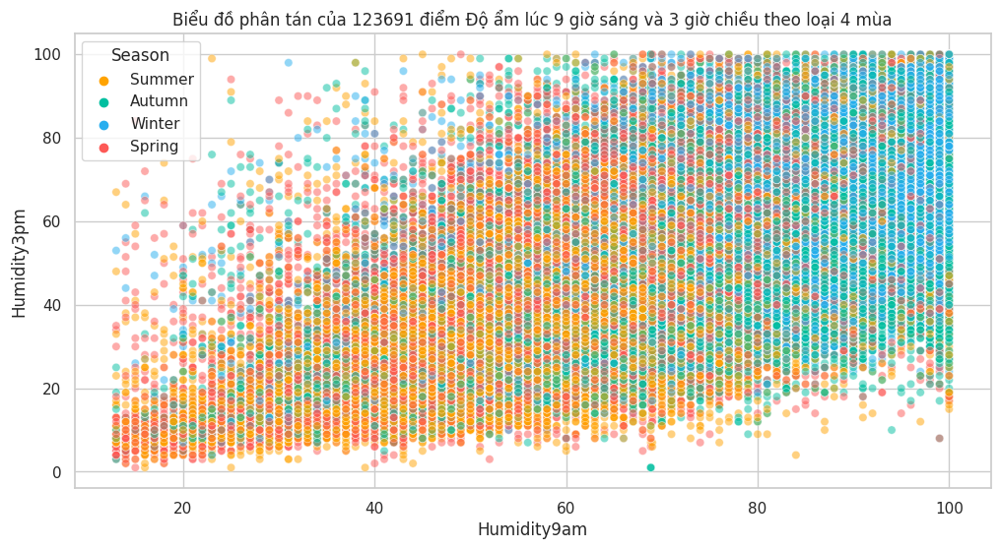

In [ ]:
title = f'Biểu đồ phân tán của {len(fourss_df1)} điểm Độ ẩm lúc 9 giờ sáng và 3 giờ chiều theo loại 4 mùa'
cluster_analysis(fourss_df1, 'Humidity9am', 'Humidity3pm', 'Season', title)

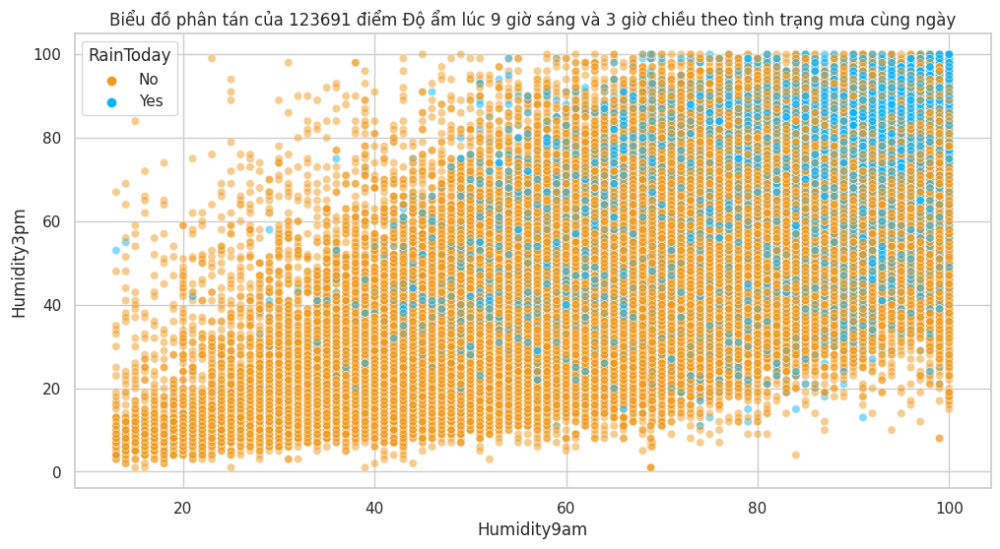

In [ ]:
title = f'Biểu đồ phân tán của {len(fourss_df1)} điểm Độ ẩm lúc 9 giờ sáng và 3 giờ chiều theo tình trạng mưa cùng ngày'
cluster_analysis(fourss_df1, 'Humidity9am', 'Humidity3pm', 'RainToday', title)

In [ ]:
rain_fourss_today_counts = fourss_df1['RainToday'].value_counts()
rain_fourss_today_counts

No     98326
Yes    25365
Name: RainToday, dtype: int64

In [ ]:
rain_fourss_tomorrow_counts = fourss_df1['RainTomorrow'].value_counts()
rain_fourss_tomorrow_counts

No     98006
Yes    25685
Name: RainTomorrow, dtype: int64

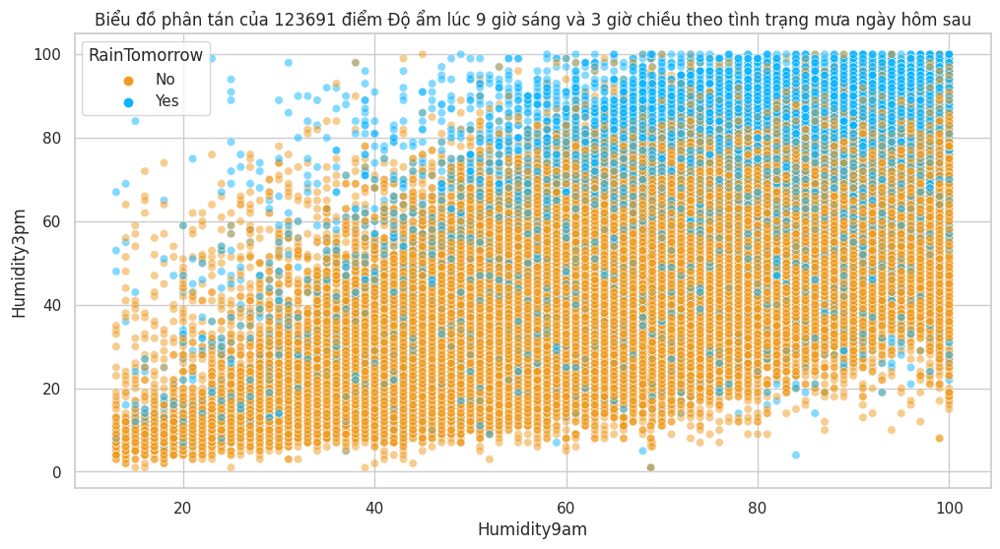

In [ ]:
title = f'Biểu đồ phân tán của {len(fourss_df1)} điểm Độ ẩm lúc 9 giờ sáng và 3 giờ chiều theo tình trạng mưa ngày hôm sau'
cluster_analysis(fourss_df1, 'Humidity9am', 'Humidity3pm', 'RainTomorrow', title)

In [ ]:
data = {'Humidity9am': twoss_df1['Humidity9am'],
        'Humidity3pm': twoss_df1['Humidity3pm']}
stats_humi_twoss = pd.DataFrame(data).describe()
display.display(stats_humi_twoss)

,Humidity9am,Humidity3pm
count,8250.000000,8250.000000
mean,54.004444,36.653727
std,21.510593,20.687648
min,13.000000,1.000000
25%,35.000000,19.000000
50%,58.000000,33.000000
75%,71.000000,51.482606
max,100.000000,100.000000


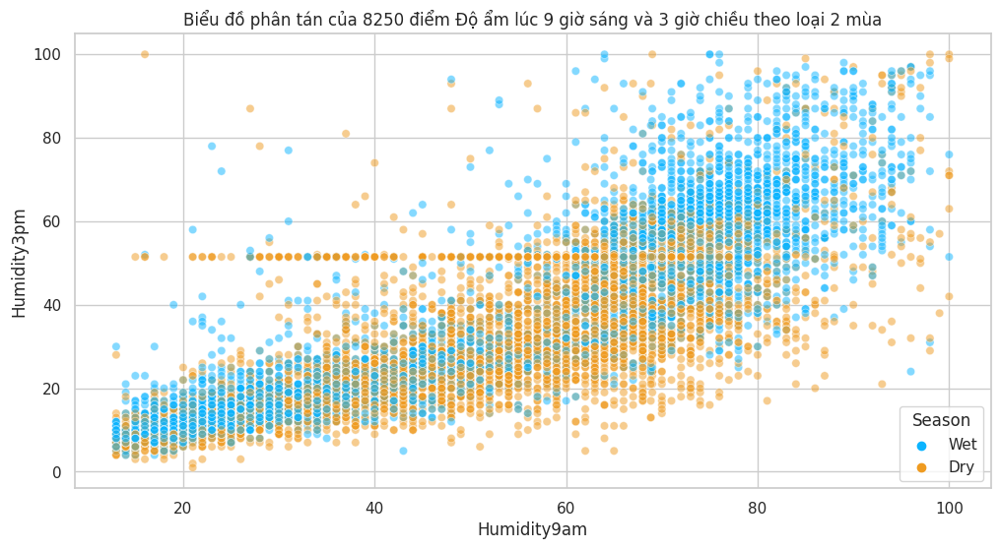

In [ ]:
title = f'Biểu đồ phân tán của {len(twoss_df1)} điểm Độ ẩm lúc 9 giờ sáng và 3 giờ chiều theo loại 2 mùa'
cluster_analysis(twoss_df1, 'Humidity9am', 'Humidity3pm', 'Season', title)

In [ ]:
rain_twoss_today_counts = twoss_df1['RainToday'].value_counts()
rain_twoss_today_counts

No     7171
Yes    1079
Name: RainToday, dtype: int64

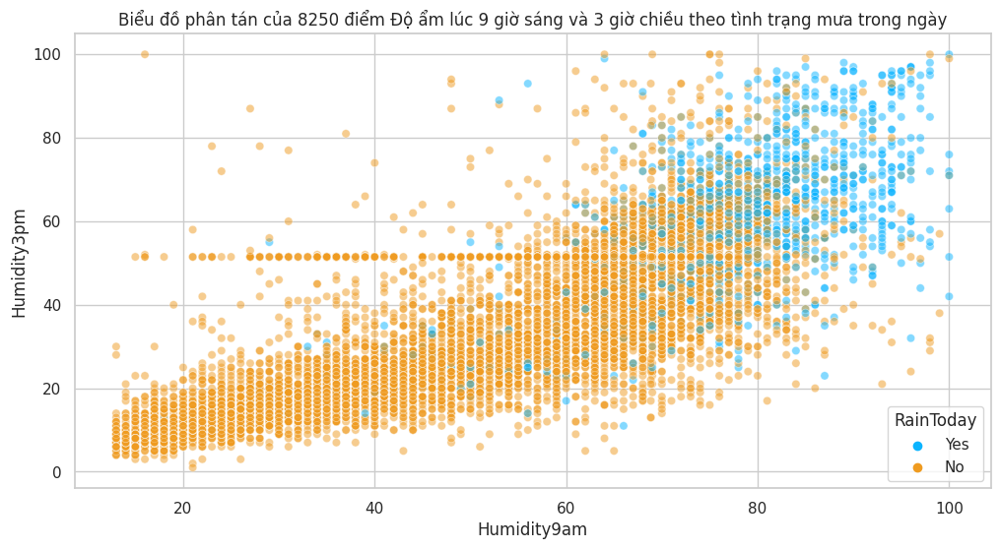

In [ ]:
title = f'Biểu đồ phân tán của {len(twoss_df1)} điểm Độ ẩm lúc 9 giờ sáng và 3 giờ chiều theo tình trạng mưa trong ngày'
cluster_analysis(twoss_df1, 'Humidity9am', 'Humidity3pm', 'RainToday', title)

In [ ]:
rain_twoss_tomorrow_counts = twoss_df1['RainTomorrow'].value_counts()
rain_twoss_tomorrow_counts

No     7144
Yes    1106
Name: RainTomorrow, dtype: int64

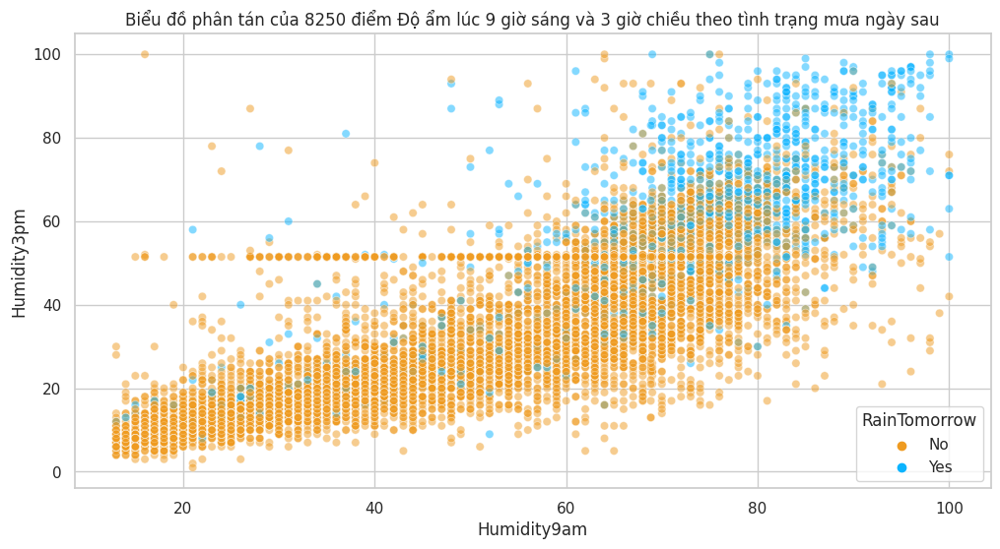

In [ ]:
title = f'Biểu đồ phân tán của {len(twoss_df1)} điểm Độ ẩm lúc 9 giờ sáng và 3 giờ chiều theo tình trạng mưa ngày sau'
cluster_analysis(twoss_df1, 'Humidity9am', 'Humidity3pm', 'RainTomorrow', title)

#### Quan sát sự phân bố áp suất

In [ ]:
col = ['Pressure9am', 'Pressure3pm']

In [ ]:
# tính tứ phân vị cho Pressure9am
Q1 = cluster_df['Pressure9am'].quantile(0.25)
Q2 = cluster_df['Pressure9am'].quantile(0.5)
Q3 = cluster_df['Pressure9am'].quantile(0.75)

# tính tứ phân vị cho Pressure3pm
q1 = cluster_df['Pressure3pm'].quantile(0.25)
q2 = cluster_df['Pressure3pm'].quantile(0.5)
q3 = cluster_df['Pressure3pm'].quantile(0.75)

# tạo nhãn cho các khoảng
labels = ['Q1', 'Q2', 'Q3', 'Q4']

# tạo các cột đếm số lần xuất hiện cho các biến áp suất
cluster_df['Pressure9am_Counts'] = pd.cut(cluster_df['Pressure9am'], bins=[-float('inf'), Q1, Q2, Q3, float('inf')], labels=labels)
cluster_df['Pressure3pm_Counts'] = pd.cut(cluster_df['Pressure3pm'], bins=[-float('inf'), q1, q2, q3, float('inf')], labels=labels)

# tạo pivot table
pres9am_pivot = pd.pivot_table(cluster_df, values='Pressure9am', index='Season', columns='Pressure9am_Counts', aggfunc='count', fill_value=0)
pres3pm_pivot = pd.pivot_table(cluster_df, values='Pressure3pm', index='Season', columns='Pressure3pm_Counts', aggfunc='count', fill_value=0)

# thêm cột tổng cộng
pres9am_pivot = pres9am_pivot.assign(Sum=pres9am_pivot.sum(axis=1))
pres3pm_pivot = pres3pm_pivot.assign(Sum=pres3pm_pivot.sum(axis=1))

# hiện crosstab
print('Crosstab biến Pressure9am đối với cụm Mùa:')
display.display(pres9am_pivot)
print('Crosstab biến Pressure9am đối với cụm Mùa:')
display.display(pres3pm_pivot)

Crosstab biến Pressure9am đối với cụm Mùa:


Pressure9am_Counts,Q1,Q2,Q3,Q4,Sum
Season,,,,,
Autumn,5163,8984,8982,9923,33052
Dry,986,1527,971,972,4456
Spring,6895,8811,7195,6964,29865
Summer,12936,9820,5319,1620,29695
Wet,2992,513,229,60,3794
Winter,4371,6793,6802,13113,31079


Crosstab biến Pressure9am đối với cụm Mùa:


Pressure3pm_Counts,Q1,Q2,Q3,Q4,Sum
Season,,,,,
Autumn,4960,9194,8984,9914,33052
Dry,1790,1108,822,736,4456
Spring,6940,9033,7017,6875,29865
Summer,12334,9846,5580,1935,29695
Wet,3216,374,183,21,3794
Winter,4286,7008,6692,13093,31079


Đếm số lần xuất hiện của các cụm `Mùa` theo khoảng tứ phân vị của biến `Áp suất`

| | Pressure9am | | | | Pressure3pm |  |  |  | Tổng cộng mỗi biến |
| - | - | - | - | - | - | - | - | - | - |
| | **Q1** | **Q2** | **Q3** | **Q4** | **Q1** | **Q2** | **Q3** | **Q4** | |
| **Mùa xuân** | 6895 | 8811 | 7195 | 6964 | 6940 | 903 | 7017 | 6875 | **29865** |
| **Mùa hè** | 12936 | 9820 | 5319 | 1620 | 12334 | 9846 | 5580 | 1935 | **29695** |
| **Mùa thu**  | 5163 | 8984 | 8982 | 9923 | 4960 | 9194 | 8984 | 9914 | **33052** |
| **Mùa đông** | 4371 | 6793 | 6802 | 13113 | 4286 | 7008 | 6692 | 13093 | **31079** |
| **Mùa khô** | 986 | 1527 | 971 | 972 | 1790 | 1108 | 822 | 736 | **4456** |
| **Mùa mưa**  | 2992 | 513 | 229 | 60 | 3216 | 374 | 183 | 21 | **3794** |

In [ ]:
# tạo pivot table
pres9am_pivot = pd.pivot_table(cluster_df, values='Pressure9am', index='RainToday', columns='Pressure9am_Counts', aggfunc='count', fill_value=0)
pres3pm_pivot = pd.pivot_table(cluster_df, values='Pressure3pm', index='RainToday', columns='Pressure3pm_Counts', aggfunc='count', fill_value=0)

# thêm cột tổng cộng
pres9am_pivot = pres9am_pivot.assign(Sum=pres9am_pivot.sum(axis=1))
pres3pm_pivot = pres3pm_pivot.assign(Sum=pres3pm_pivot.sum(axis=1))

# hiện crosstab
print('Crosstab biến Pressure9am đối với cụm khả năng mưa trong ngày:')
display.display(pres9am_pivot)
print('Crosstab biến Pressure3pm đối với cụm khả năng mưa trong ngày:')
display.display(pres3pm_pivot)

Crosstab biến Pressure9am đối với cụm khả năng mưa trong ngày:


Pressure9am_Counts,Q1,Q2,Q3,Q4,Sum
RainToday,,,,,
No,23694,29484,24390,27929,105497
Yes,9649,6964,5108,4723,26444


Crosstab biến Pressure3pm đối với cụm khả năng mưa trong ngày:


Pressure3pm_Counts,Q1,Q2,Q3,Q4,Sum
RainToday,,,,,
No,25318,29710,23841,26628,105497
Yes,8208,6853,5437,5946,26444


In [ ]:
# tạo pivot table
pres9am_pivot = pd.pivot_table(cluster_df, values='Pressure9am', index='RainTomorrow', columns='Pressure9am_Counts', aggfunc='count', fill_value=0)
pres3pm_pivot = pd.pivot_table(cluster_df, values='Pressure3pm', index='RainTomorrow', columns='Pressure3pm_Counts', aggfunc='count', fill_value=0)

# thêm cột tổng cộng
pres9am_pivot = pres9am_pivot.assign(Sum=pres9am_pivot.sum(axis=1))
pres3pm_pivot = pres3pm_pivot.assign(Sum=pres3pm_pivot.sum(axis=1))

# hiện crosstab
print('Crosstab biến Pressure9am đối với cụm khả năng mưa ngày hôm sau:')
display.display(pres9am_pivot)
print('Crosstab biến Pressure3pm đối với cụm khả năng mưa ngày hôm sau:')
display.display(pres3pm_pivot)

Crosstab biến Pressure9am đối với cụm khả năng mưa ngày hôm sau:


Pressure9am_Counts,Q1,Q2,Q3,Q4,Sum
RainTomorrow,,,,,
No,22574,29103,24661,28812,105150
Yes,10769,7345,4837,3840,26791


Crosstab biến Pressure3pm đối với cụm khả năng mưa ngày hôm sau:


Pressure3pm_Counts,Q1,Q2,Q3,Q4,Sum
RainTomorrow,,,,,
No,23017,29179,24487,28467,105150
Yes,10509,7384,4791,4107,26791


So sánh ba phương pháp

In [ ]:
print('Thống kê mô tả cả bộ dữ liệu:')
display.display(cluster_df[col].describe()[:3])
print('Đại diện bằng yếu vị mode:')
display.display(cluster_reduced_mode_df[col].describe()[:3])
print('Đại diện bằng trung bình mean:')
display.display(cluster_reduced_mean_df[col].describe()[:3])
print('Đại diện bằng trung vị median:')
display.display(cluster_reduced_median_df[col].describe()[:3])

Thống kê mô tả cả bộ dữ liệu:


,Pressure9am,Pressure3pm
count,131941.000000,131941.000000
mean,1018.057662,1015.613548
std,6.370778,6.347936


Đại diện bằng yếu vị mode:


,Pressure9am,Pressure3pm
count,4762.000000,4762.000000
mean,1015.489430,1013.183934
std,6.330754,6.244072


Đại diện bằng trung bình mean:


,Pressure9am,Pressure3pm
count,4762.000000,4762.000000
mean,1017.992962,1015.549264
std,3.751539,3.840063


Đại diện bằng trung vị median:


,Pressure9am,Pressure3pm
count,4762.000000,4762.000000
mean,1018.248603,1015.768766
std,3.957234,4.035705


Sử dụng **mode** cho các biến định lượng và định tính dựa trên quy tắc cũ. Vậy nên không cần phải khởi tạo lại các dataframe sử dụng đại diện là yếu vị.

In [ ]:
data = {'Pressure9am': fourss_df1['Pressure9am'],
        'Pressure3pm': fourss_df1['Pressure3pm']}
stats_pres_fourss = pd.DataFrame(data).describe()
display.display(stats_pres_fourss)

,Pressure9am,Pressure3pm
count,123691.000000,123691.000000
mean,1018.266584,1015.912454
std,6.362848,6.285767
min,998.200000,996.400000
25%,1014.300000,1012.000000
50%,1017.653758,1015.258204
75%,1022.300000,1019.900000
max,1037.700000,1034.700000


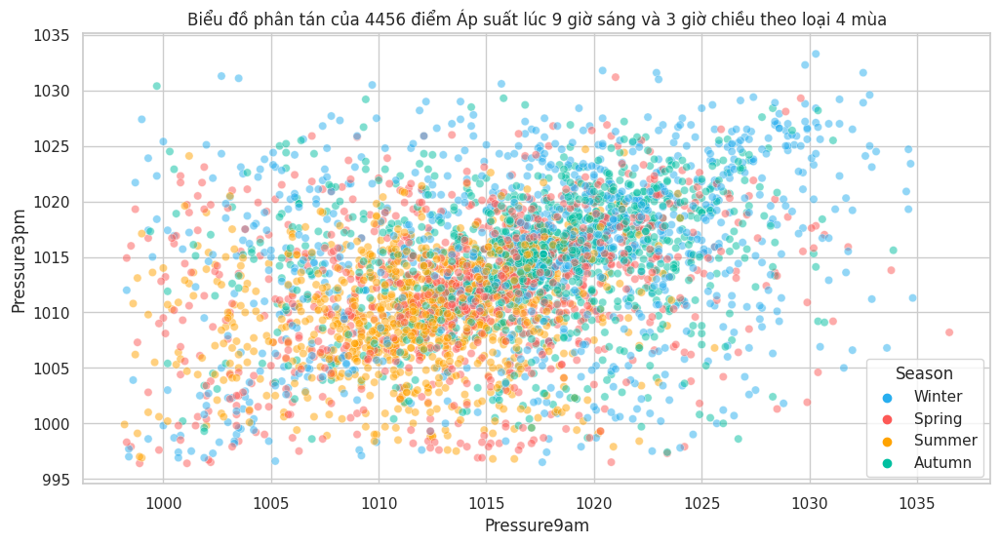

In [ ]:
title = f'Biểu đồ phân tán của {len(fourss_df2)} điểm Áp suất lúc 9 giờ sáng và 3 giờ chiều theo loại 4 mùa'
cluster_analysis(fourss_df2, 'Pressure9am', 'Pressure3pm', 'Season', title)

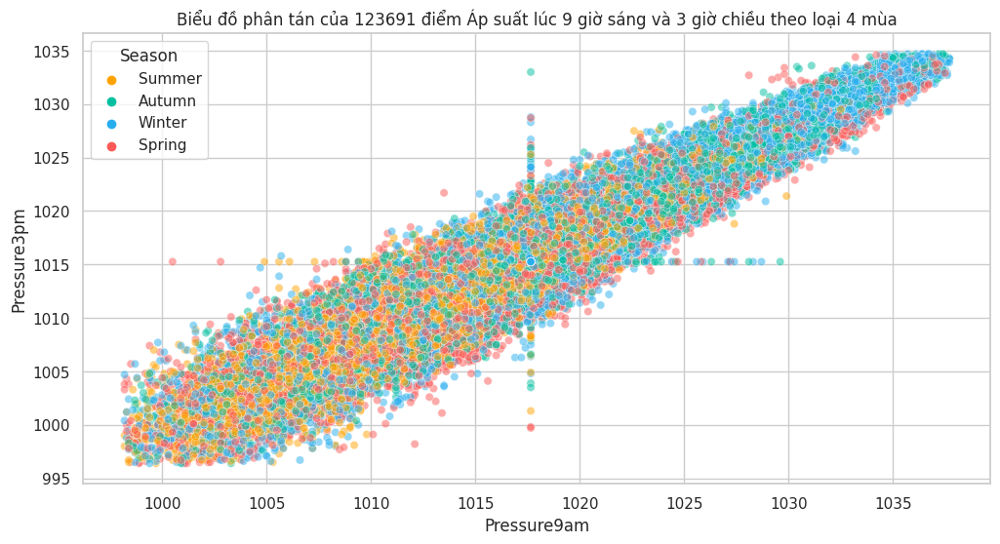

In [ ]:
title = f'Biểu đồ phân tán của {len(fourss_df1)} điểm Áp suất lúc 9 giờ sáng và 3 giờ chiều theo loại 4 mùa'
cluster_analysis(fourss_df1, 'Pressure9am', 'Pressure3pm', 'Season', title)

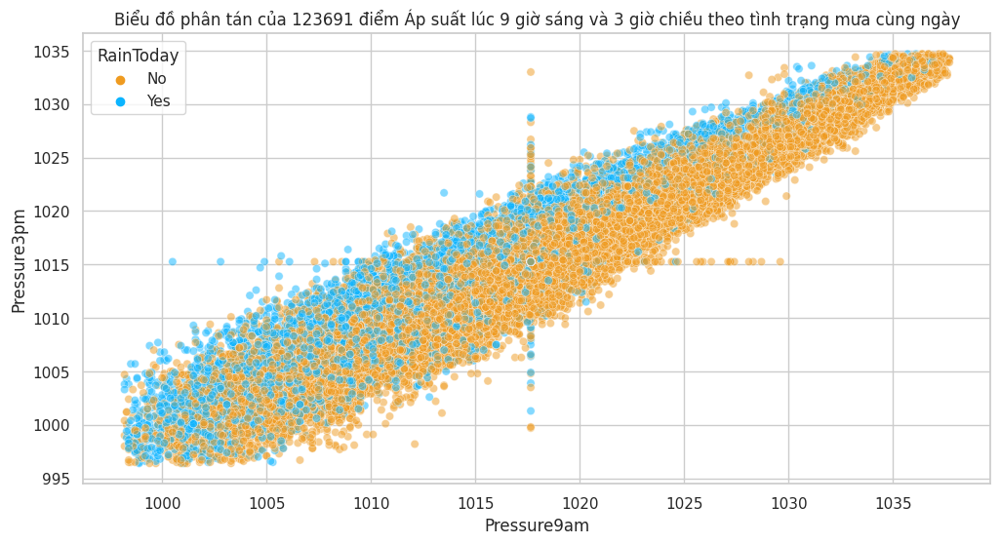

In [ ]:
title = f'Biểu đồ phân tán của {len(fourss_df1)} điểm Áp suất lúc 9 giờ sáng và 3 giờ chiều theo tình trạng mưa cùng ngày'
cluster_analysis(fourss_df1, 'Pressure9am', 'Pressure3pm', 'RainToday', title)

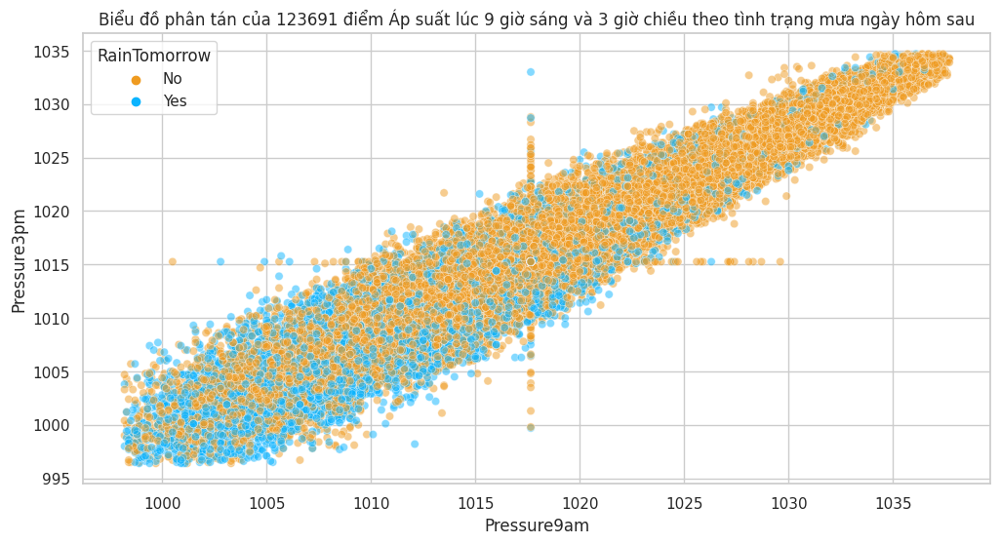

In [ ]:
title = f'Biểu đồ phân tán của {len(fourss_df1)} điểm Áp suất lúc 9 giờ sáng và 3 giờ chiều theo tình trạng mưa ngày hôm sau'
cluster_analysis(fourss_df1, 'Pressure9am', 'Pressure3pm', 'RainTomorrow', title)

In [ ]:
data = {'Pressure9am': twoss_df1['Pressure9am'],
        'Pressure3pm': twoss_df1['Pressure3pm']}
stats_pres_twoss = pd.DataFrame(data).describe()
display.display(stats_pres_twoss)

,Pressure9am,Pressure3pm
count,8250.000000,8250.000000
mean,1014.925324,1011.132096
std,5.624825,5.536492
min,998.900000,996.500000
25%,1011.000000,1007.300000
50%,1014.300000,1010.300000
75%,1018.200000,1014.200000
max,1034.100000,1029.800000


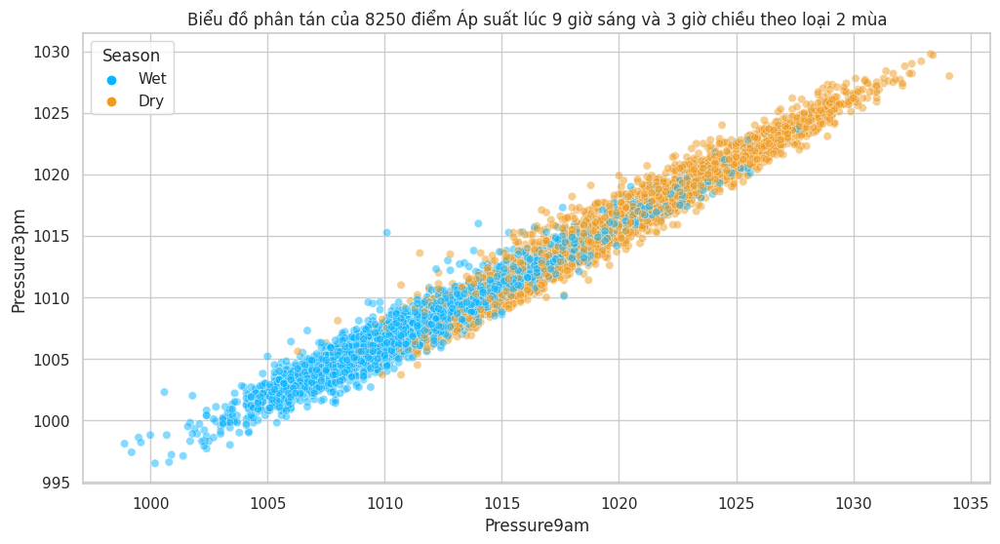

In [ ]:
title = f'Biểu đồ phân tán của {len(twoss_df1)} điểm Áp suất lúc 9 giờ sáng và 3 giờ chiều theo loại 2 mùa'
cluster_analysis(twoss_df1, 'Pressure9am', 'Pressure3pm', 'Season', title)

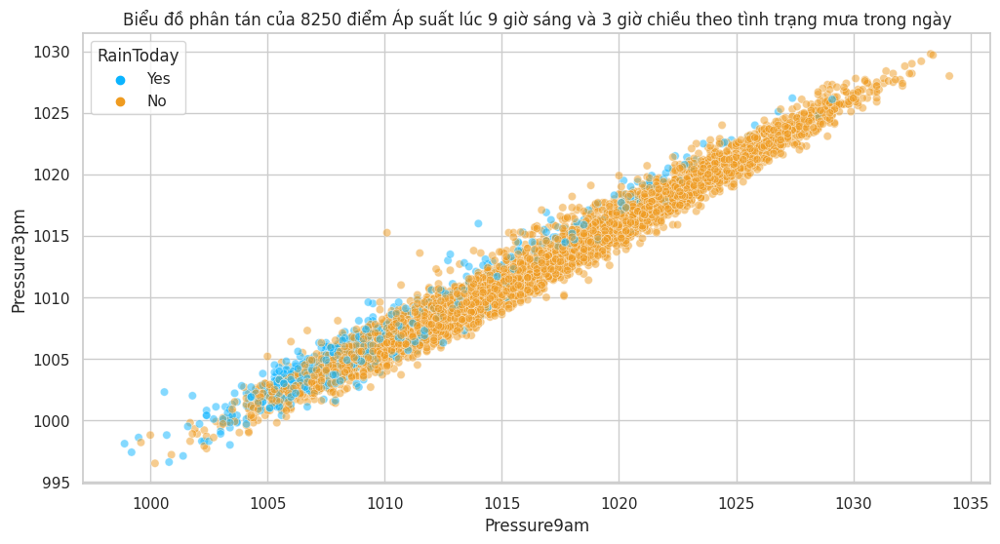

In [ ]:
title = f'Biểu đồ phân tán của {len(twoss_df1)} điểm Áp suất lúc 9 giờ sáng và 3 giờ chiều theo tình trạng mưa trong ngày'
cluster_analysis(twoss_df1, 'Pressure9am', 'Pressure3pm', 'RainToday', title)

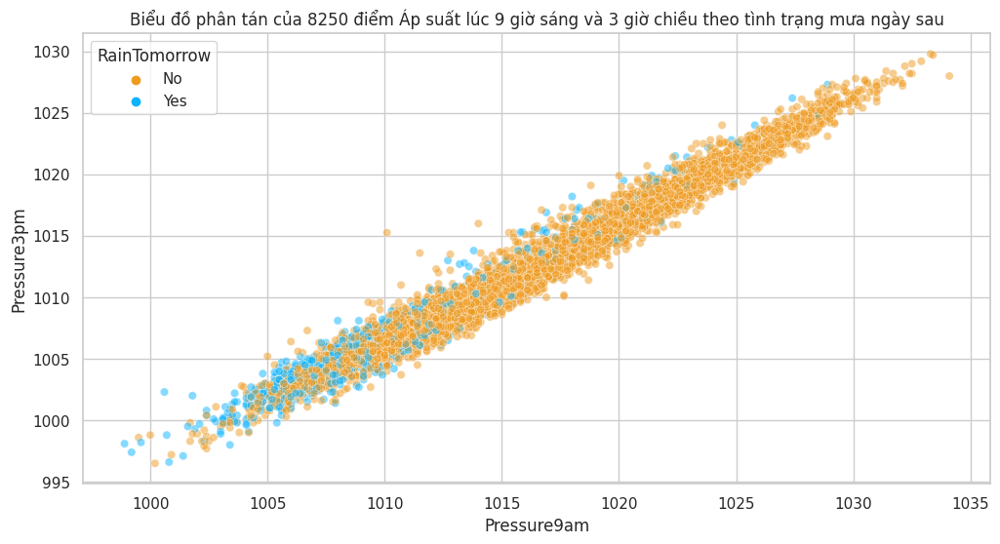

In [ ]:
title = f'Biểu đồ phân tán của {len(twoss_df1)} điểm Áp suất lúc 9 giờ sáng và 3 giờ chiều theo tình trạng mưa ngày sau'
cluster_analysis(twoss_df1, 'Pressure9am', 'Pressure3pm', 'RainTomorrow', title)